# Final Notebook 2
This notebook will contain spatial autocorrelation for number of harmful facilities weighted by percentage of hispanic residents in each blockgroup. Additionally, it will include a bar chart analyzing the most affeted block groups.

In [1]:
# usuals

import geopandas as gpd
import pandas as pd

import matplotlib.pyplot as plt

# for folium plots
import folium
from folium.plugins import MarkerCluster
from folium import IFrame 
from geopy.geocoders import Nominatim
import branca.colormap as cm

# for interactive plots
import plotly.express as px

import contextily as ctx
from sodapy import Socrata

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


## Spatial Autocorrelation
I will use my facilities gdf and blocks_Race in order to conduct a spatial autocorrelation of number of facilities in each block group when weighted by percentage of Hispanic residents.

In [2]:
# import facilities
facilities = gpd.read_file('facilities.geojson')
facilities = facilities.to_crs(epsg=4326)

In [3]:
# import block group demos
blocks_Race = gpd.read_file('blocks_Race.geojson')
blocks_Race.head()

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_STATE,...,PCT_Not_Hispanic,PCT_White,PCT_Black,PCT_American_Indian,PCT_Asian,PCT_Pacific_Islander,PCT_Other,PCT_Two_or_more,PCT_Hispanic,geometry
0,060372932023,15000US060372932023,Block Group 3,"Block Group 3, Census Tract 2932.02, Los Angel...",ca,150,0,ACSSF,16693,06,...,30.19,5.18,11.10,0.0,11.88,0.00,0.00,2.03,69.81,"POLYGON ((-118.29910 33.81975, -118.29918 33.8..."
1,060372941201,15000US060372941201,Block Group 1,"Block Group 1, Census Tract 2941.20, Los Angel...",ca,150,0,ACSSF,16706,06,...,6.47,0.98,5.49,0.0,0.00,0.00,0.00,0.00,93.53,"POLYGON ((-118.24598 33.80005, -118.24600 33.8..."
2,060372932022,15000US060372932022,Block Group 2,"Block Group 2, Census Tract 2932.02, Los Angel...",ca,150,0,ACSSF,16692,06,...,25.33,1.30,4.23,0.0,18.98,0.00,0.81,0.00,74.67,"POLYGON ((-118.29908 33.82230, -118.29930 33.8..."
3,060372932021,15000US060372932021,Block Group 1,"Block Group 1, Census Tract 2932.02, Los Angel...",ca,150,0,ACSSF,16691,06,...,37.91,14.38,3.94,0.0,16.16,0.00,0.00,3.44,62.09,"POLYGON ((-118.29920 33.82570, -118.29939 33.8..."
4,060372941101,15000US060372941101,Block Group 1,"Block Group 1, Census Tract 2941.10, Los Angel...",ca,150,0,ACSSF,16703,06,...,11.32,5.86,0.00,0.0,0.00,1.28,0.00,4.18,88.68,"POLYGON ((-118.25846 33.79945, -118.25754 33.8..."


In [4]:
# remove na values
blocks_Race = blocks_Race[blocks_Race['PCT_Hispanic'].notna()]

In [5]:
# check dtypes
blocks_Race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6395 entries, 0 to 6421
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Geo_FIPS              6395 non-null   object  
 1   Geo_GEOID             6395 non-null   object  
 2   Geo_NAME              6395 non-null   object  
 3   Geo_QName             6395 non-null   object  
 4   Geo_STUSAB            6395 non-null   object  
 5   Geo_SUMLEV            6395 non-null   int64   
 6   Geo_GEOCOMP           6395 non-null   int64   
 7   Geo_FILEID            6395 non-null   object  
 8   Geo_LOGRECNO          6395 non-null   int64   
 9   Geo_STATE             6395 non-null   object  
 10  Geo_COUNTY            6395 non-null   object  
 11  Geo_TRACT             6395 non-null   object  
 12  Geo_BLKGRP            6395 non-null   int64   
 13  Total_Population      6395 non-null   int64   
 14  PCT_Not_Hispanic      6395 non-null   float64 
 

In [6]:
# left spatial join of facilities and demos
join = gpd.sjoin(facilities, blocks_Race, how='left')
join.head()

,Facility Name,Type,lon,lat,geometry,index_right,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,...,Total_Population,PCT_Not_Hispanic,PCT_White,PCT_Black,PCT_American_Indian,PCT_Asian,PCT_Pacific_Islander,PCT_Other,PCT_Two_or_more,PCT_Hispanic
0,Chiquita Canyon Sanitary Landfill,Waste Facility,-1.320768e+07,4.086620e+06,POINT (-118.64661 34.42950),5852.0,060379201061,15000US060379201061,Block Group 1,"Block Group 1, Census Tract 9201.06, Los Angel...",...,3381.0,38.04,32.39,1.92,0.00,2.81,0.00,0.0,0.92,61.96
1,Pebbly Beach (Avalon) Disposal Site,Waste Facility,-1.317021e+07,3.939588e+06,POINT (-118.31000 33.33300),3800.0,060375991002,15000US060375991002,Block Group 2,"Block Group 2, Census Tract 5991, Los Angeles ...",...,295.0,94.92,87.12,0.00,0.00,5.08,0.00,0.0,2.71,5.08
2,San Clemente Island Landfill,Waste Facility,-1.319543e+07,3.890625e+06,POINT (-118.53652 32.96474),5807.0,060375991001,15000US060375991001,Block Group 1,"Block Group 1, Census Tract 5991, Los Angeles ...",...,188.0,82.98,48.40,7.45,0.00,0.00,27.13,0.0,0.00,17.02
3,La Co Dept Public Wrks Roads Dept #552TS,Waste Facility,-1.315016e+07,4.125026e+06,POINT (-118.12989 34.71358),1956.0,060379006022,15000US060379006022,Block Group 2,"Block Group 2, Census Tract 9006.02, Los Angel...",...,2919.0,36.18,14.66,17.20,0.07,2.06,0.00,0.0,2.19,63.82
4,La Co Dept Public Wrks Roads Dept #558TS,Waste Facility,-1.313332e+07,4.102041e+06,POINT (-117.97858 34.54368),1298.0,060379100021,15000US060379100021,Block Group 1,"Block Group 1, Census Tract 9100.02, Los Angel...",...,4075.0,24.02,19.17,0.47,2.67,0.00,0.00,0.0,1.72,75.98


In [7]:
# number of facilities in each block group
facilities_block = join.Geo_FIPS.value_counts().rename_axis('Geo_FIPS').reset_index(name='facilities_count')
facilities_block.head()

,Geo_FIPS,facilities_count
0,060375324001,20
1,060371211021,16
2,060372060312,10
3,060375361041,8
4,060374046002,8


In [8]:
# merge value counts to blocks_Race
blocks_Race = blocks_Race.merge(facilities_block,on='Geo_FIPS')

In [9]:
# create facilities weighted by % hisp
blocks_Race['fac_by_hisp'] = blocks_Race['facilities_count'] * (blocks_Race['PCT_Hispanic']*.01)

In [10]:
# change projection
blocks_Race = blocks_Race.to_crs('EPSG:3857')

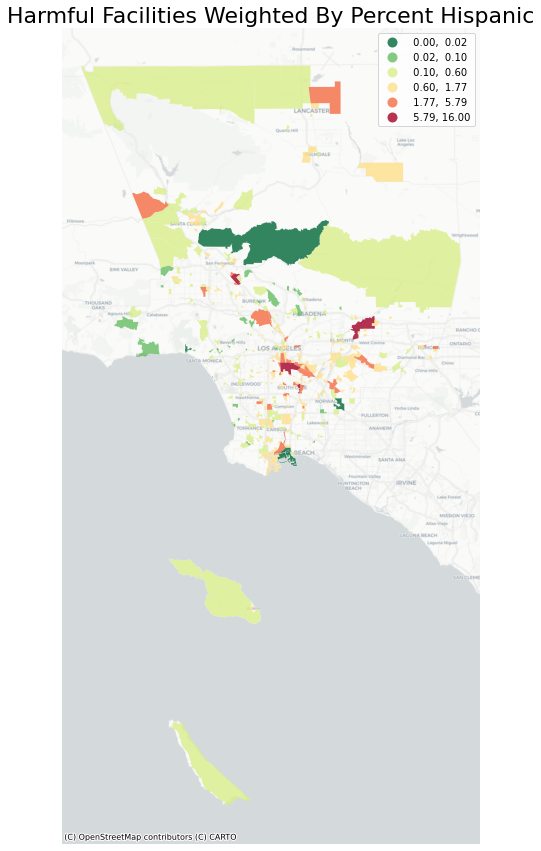

In [11]:
# create choropleth of fac_by_hisp
fig,ax = plt.subplots(figsize=(15,15))

blocks_Race.plot(ax=ax,
        column='fac_by_hisp',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='percentiles')

ax.axis('off')
ax.set_title('Harmful Facilities Weighted By Percent Hispanic',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [12]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(blocks_Race,k=8)

# Row-standardization
wq.transform = 'r'

In [13]:
# create a new column for the spatial lag
blocks_Race['fac_by_hisp_lag'] = lps.weights.lag_spatial(wq, blocks_Race['fac_by_hisp'])

In [14]:
# show sample of important columns
blocks_Race.sample(10)[['PCT_Hispanic','facilities_count','fac_by_hisp','fac_by_hisp_lag']]

,PCT_Hispanic,facilities_count,fac_by_hisp,fac_by_hisp_lag
290,35.68,3,1.0704,0.323988
366,75.77,2,1.5154,1.612662
369,92.71,3,2.7813,1.371838
232,25.74,1,0.2574,0.835475
87,85.07,1,0.8507,1.032238
30,70.42,1,0.7042,1.374662
313,42.09,1,0.4209,0.328050
302,88.14,1,0.8814,0.766987
45,89.14,1,0.8914,1.605450
326,17.57,1,0.1757,0.719812


In [15]:
# calculate lag difference
blocks_Race['fac_lag_diff'] = blocks_Race['fac_by_hisp'] - blocks_Race['fac_by_hisp_lag']

In [16]:
# change to WGS84 for mapbox
blocks_Race_web = blocks_Race.to_crs('EPSG:4326')

In [17]:
# find the centroid
minx, miny, maxx, maxy = blocks_Race_web.geometry.total_bounds
center_lat_blocks_Race_web = (maxy-miny)/2+miny
center_lon_blocks_Race_web = (maxx-minx)/2+minx

In [18]:
# basic stats of lag
blocks_Race_web.fac_by_hisp_lag.describe()

count    374.000000
mean       0.924846
std        0.640091
min        0.073775
25%        0.485838
50%        0.772550
75%        1.234253
max        3.793687
Name: fac_by_hisp_lag, dtype: float64

In [19]:
# set the median of the data
median = blocks_Race_web.fac_by_hisp_lag.median()

In [20]:
# set the mapbox access token
token = 'pk.eyJ1IjoibWF0dGhldy1scWNoIiwiYSI6ImNrbTQ5a3pkejAyaHAydnJidG11NW0zM3AifQ.7Uzecsd0aERuwaSgX1s1uw'
px.set_mapbox_access_token(token)

In [21]:
# make mapbox choropleth for each block group
fig = px.choropleth_mapbox(blocks_Race_web, 
                     geojson=blocks_Race_web.geometry, # geometry column
                     locations=blocks_Race_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='fac_by_hisp',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median, # set median as color scale midpoint
                     range_color =(0,median*2),
                     hover_data=['PCT_Hispanic','facilities_count','fac_by_hisp','fac_by_hisp_lag'],
                     center = {"lat": center_lat_blocks_Race_web, "lon": center_lon_blocks_Race_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'fac_by_hisp_lag':'Environmentally Harmful Facilities Weighted by % of Hispanics - Spatial Lag',
                             'PCT_Hispanic':'Percentage Hispanic',
                             'facilities_count':'# of Environmentally Harmful Facilities',
                             'fac_by_hisp':'# of Environmentally Harmful Facilities Weighted by % of Hispanics',
                             
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [22]:
# save as html
fig.write_html("faclag_choro.html")

In [23]:
# create Moran value
y = blocks_Race.fac_by_hisp
moran = Moran(y, wq)
moran.I

0.12925552748634944

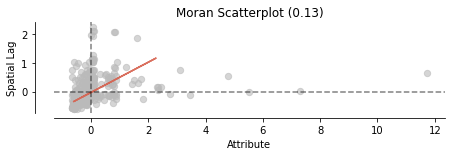

In [24]:
# plot Moran scatterplot
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

In [25]:
# find simulated moran value
moran.p_sim

0.001

In [26]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

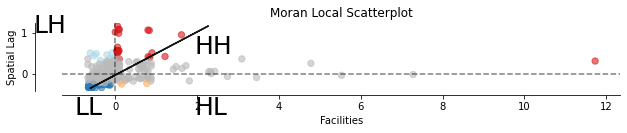

In [27]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Facilities")
ax.set_ylabel('Spatial Lag')

# add labels for categories
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

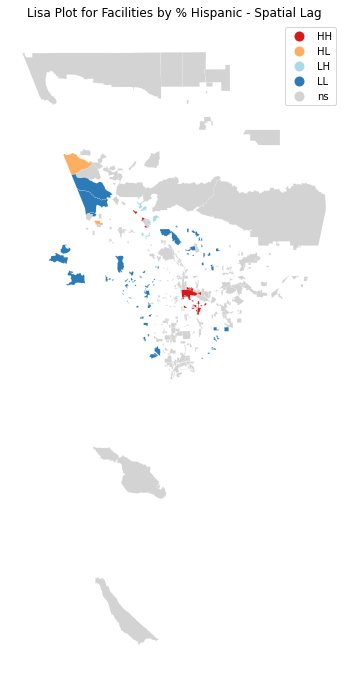

In [28]:
# make plot from lisa 
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, blocks_Race, p=0.05, ax=ax)
plt.title('Lisa Plot for Facilities by % Hispanic - Spatial Lag')
plt.show()

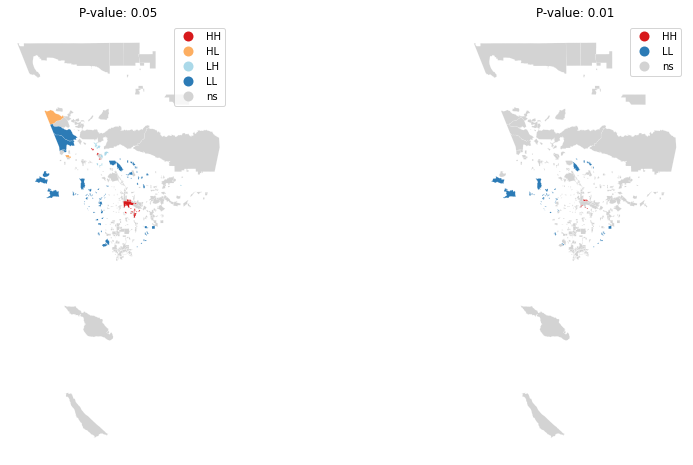

In [29]:
# create 2 subplots for spatial lag maps
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# p value .05 for left plot
lisa_cluster(lisa, blocks_Race, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# p value .01 for right plot
lisa_cluster(lisa, blocks_Race, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

## Facilities Count Bar Chart
I will now make a plotly bar cahrt showing the block groups with the most harmful facilities and their key demographics.

In [30]:
# sort blocks by no. of facilities
blocks_Race_sort = blocks_Race.sort_values(by='facilities_count')
blocks_Race_sort.tail()

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_STATE,...,PCT_Asian,PCT_Pacific_Islander,PCT_Other,PCT_Two_or_more,PCT_Hispanic,geometry,facilities_count,fac_by_hisp,fac_by_hisp_lag,fac_lag_diff
57,060375361041,15000US060375361041,Block Group 1,"Block Group 1, Census Tract 5361.04, Los Angel...",ca,150,0,ACSSF,18725,06,...,3.06,0.0,0.0,1.68,87.94,"POLYGON ((-13154955.644 4022668.201, -13155000...",8,7.0352,1.567925,5.467275
136,060374046002,15000US060374046002,Block Group 2,"Block Group 2, Census Tract 4046, Los Angeles ...",ca,150,0,ACSSF,17323,06,...,0.00,0.0,0.0,0.00,100.00,"POLYGON ((-13127837.100 4046753.213, -13127837...",8,8.0000,0.848638,7.151363
77,060372060312,15000US060372060312,Block Group 2,"Block Group 2, Census Tract 2060.31, Los Angel...",ca,150,0,ACSSF,15587,06,...,6.05,0.0,0.0,6.63,17.79,"POLYGON ((-13160493.456 4030809.334, -13160501...",10,1.7790,1.571538,0.207462
112,060371211021,15000US060371211021,Block Group 1,"Block Group 1, Census Tract 1211.02, Los Angel...",ca,150,0,ACSSF,14666,06,...,2.55,0.0,0.0,0.00,64.12,"POLYGON ((-13177508.089 4063335.240, -13177685...",16,10.2592,0.894900,9.364300
284,060375324001,15000US060375324001,Block Group 1,"Block Group 1, Census Tract 5324, Los Angeles ...",ca,150,0,ACSSF,18515,06,...,0.00,0.0,0.0,0.00,80.00,"POLYGON ((-13158279.311 4030677.990, -13158294...",20,16.0000,1.702625,14.297375


In [31]:
# new gdf with last 15 rows
blocks_data = blocks_Race_sort.tail(15)

In [32]:
# double check data 
blocks_data.tail(10)

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_STATE,...,PCT_Asian,PCT_Pacific_Islander,PCT_Other,PCT_Two_or_more,PCT_Hispanic,geometry,facilities_count,fac_by_hisp,fac_by_hisp_lag,fac_lag_diff
179,060374028011,15000US060374028011,Block Group 1,"Block Group 1, Census Tract 4028.01, Los Angel...",ca,150,0,ACSSF,17192,06,...,6.12,0.0,0.00,0.00,88.74,"POLYGON ((-13104779.378 4035811.739, -13104774...",6,5.3244,0.718175,4.606225
318,060375323042,15000US060375323042,Block Group 2,"Block Group 2, Census Tract 5323.04, Los Angel...",ca,150,0,ACSSF,18514,06,...,0.27,0.0,0.00,0.00,63.58,"POLYGON ((-13153510.828 4028312.180, -13154036...",6,3.8148,1.070412,2.744388
315,060375027002,15000US060375027002,Block Group 2,"Block Group 2, Census Tract 5027, Los Angeles ...",ca,150,0,ACSSF,18295,06,...,4.89,0.0,5.18,2.01,64.53,"POLYGON ((-13142378.654 4024682.371, -13142391...",6,3.8718,1.073725,2.798075
120,060379800331,15000US060379800331,Block Group 1,"Block Group 1, Census Tract 9800.33, Los Angel...",ca,150,0,ACSSF,20724,06,...,0.00,0.0,0.00,0.00,0.00,"MULTIPOLYGON (((-13158941.660 3999659.369, -13...",7,0.0000,1.499063,-1.499063
118,060379800141,15000US060379800141,Block Group 1,"Block Group 1, Census Tract 9800.14, Los Angel...",ca,150,0,ACSSF,20710,06,...,0.00,0.0,0.00,0.00,55.56,"MULTIPOLYGON (((-13160700.954 4005245.639, -13...",7,3.8892,0.951450,2.937750
57,060375361041,15000US060375361041,Block Group 1,"Block Group 1, Census Tract 5361.04, Los Angel...",ca,150,0,ACSSF,18725,06,...,3.06,0.0,0.00,1.68,87.94,"POLYGON ((-13154955.644 4022668.201, -13155000...",8,7.0352,1.567925,5.467275
136,060374046002,15000US060374046002,Block Group 2,"Block Group 2, Census Tract 4046, Los Angeles ...",ca,150,0,ACSSF,17323,06,...,0.00,0.0,0.00,0.00,100.00,"POLYGON ((-13127837.100 4046753.213, -13127837...",8,8.0000,0.848638,7.151363
77,060372060312,15000US060372060312,Block Group 2,"Block Group 2, Census Tract 2060.31, Los Angel...",ca,150,0,ACSSF,15587,06,...,6.05,0.0,0.00,6.63,17.79,"POLYGON ((-13160493.456 4030809.334, -13160501...",10,1.7790,1.571538,0.207462
112,060371211021,15000US060371211021,Block Group 1,"Block Group 1, Census Tract 1211.02, Los Angel...",ca,150,0,ACSSF,14666,06,...,2.55,0.0,0.00,0.00,64.12,"POLYGON ((-13177508.089 4063335.240, -13177685...",16,10.2592,0.894900,9.364300
284,060375324001,15000US060375324001,Block Group 1,"Block Group 1, Census Tract 5324, Los Angeles ...",ca,150,0,ACSSF,18515,06,...,0.00,0.0,0.00,0.00,80.00,"POLYGON ((-13158279.311 4030677.990, -13158294...",20,16.0000,1.702625,14.297375


In [33]:
# create bar chart with demographics as hover
fig = px.bar(blocks_data, x='Geo_GEOID', y='facilities_count',
             hover_data=['PCT_Hispanic', 'PCT_Black', 'PCT_American_Indian', 'Total_Population'], color='PCT_Hispanic',
             labels={'Geo_GEOID':'Geo ID','facilities_count':'# of Harmful Facilities'}, height=600)
fig.show()

In [34]:
# save as html
fig.write_html("fac_bar.html")